# Necessary imports and configurations

In [6]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive, files
from PIL import Image
from collections import defaultdict
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
from torchvision import transforms
from tqdm import tqdm
import shutil
from sklearn.model_selection import train_test_split
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

In [3]:
drive.mount('/content/gdrive')
zip_file_path = "/content/gdrive/MyDrive/dataset/final/dataset_apres_cleaning.zip"
extracted_folder_path = '/content/dataset/'
# Unzip the file using the command line
!unzip "$zip_file_path" -d "$extracted_folder_path"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_840_125.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_300_73.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_780_105.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_600_243.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_720_256.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_180_41.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_540_249.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_840_321.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_600_377.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_180_285.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_420_112.jpg  
  inflating: /content/dataset/dataset_apres_cleaning/car/frame_840_223.jpg  
  inflating: /content/datas

# Data Analysis

## Data Distribution per class

In [4]:
dict_class = defaultdict()
dict_class['car'] = len(os.listdir('/content/dataset/dataset_apres_cleaning/car'))
dict_class['no_car'] = len(os.listdir('/content/dataset/dataset_apres_cleaning/no_car'))

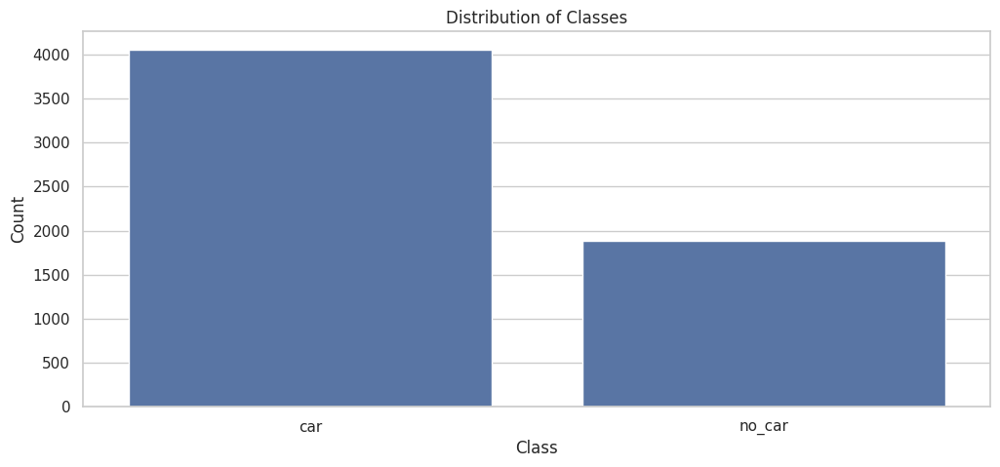

In [5]:
df = pd.DataFrame(list(dict_class.items()), columns=['Class', 'Count'])
# Plot the distribution using seaborn barplot
plt.figure(figsize=(12, 5))
sns.set_theme(style="whitegrid")
sns.barplot(data=df, x='Class', y='Count')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

As we can see here,our classes aren't evenly balanced, so we're using data augmentation to fix that.

In [12]:
folder_path = '/content/dataset/dataset_apres_cleaning/no_car'

# Define an empty list to store augmented images
augmented_images = []

# Define augmentation pipeline
transform = A.Compose([
    A.HorizontalFlip(p=1.0),
])

# Apply augmentation only to the images in the "no_car" folder
for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)  # Read the image
    # Apply transformation
    transformed = transform(image=image)
    augmented_image = transformed["image"]
    augmented_image_path = os.path.join(folder_path, f"augmented_{filename}")
    cv2.imwrite(augmented_image_path, augmented_image)

In [14]:
dict_class = defaultdict()
dict_class['car'] = len(os.listdir('/content/dataset/dataset_apres_cleaning/car'))
dict_class['no_car'] = len(os.listdir('/content/dataset/dataset_apres_cleaning/no_car'))

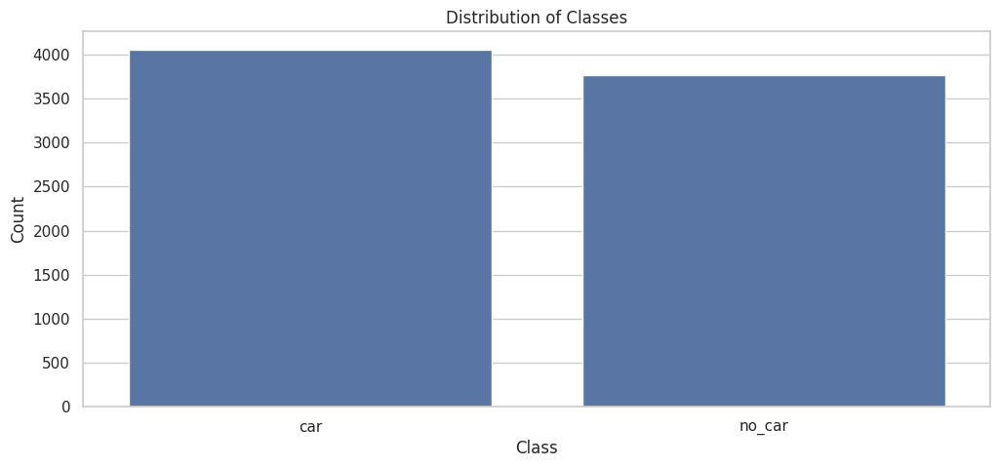

In [15]:
df = pd.DataFrame(list(dict_class.items()), columns=['Class', 'Count'])
# Plot the distribution using seaborn barplot
plt.figure(figsize=(12, 5))
sns.set_theme(style="whitegrid")
sns.barplot(data=df, x='Class', y='Count')
plt.title('Distribution of Classes')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

## Number of pixels

In [16]:
def get_image_dimensions(folder_path):
    image_dimensions = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                file_path = os.path.join(root, file)
                with Image.open(file_path) as img:
                    width, height = img.size
                    image_dimensions.append((width, height))
    return image_dimensions

main_folder_path = '/content/dataset/dataset_apres_cleaning/'
dimension_list_total = []
subfolders = os.listdir(main_folder_path)
for subfolder in subfolders:
    subfolder_path = os.path.join(main_folder_path, subfolder)
    dimensions_list = get_image_dimensions(subfolder_path)
    dimension_list_total += dimensions_list

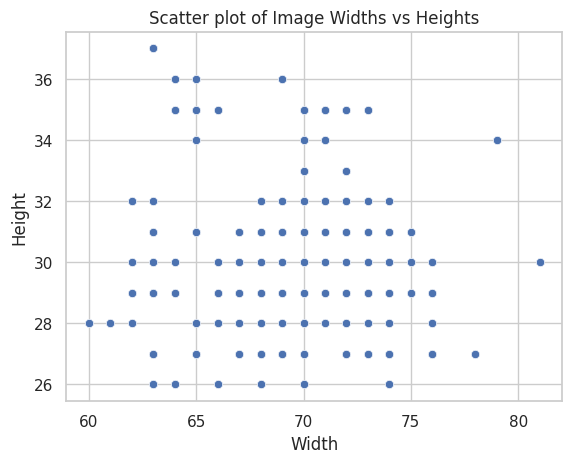

In [17]:
# Unzip the dimensions into separate lists
widths, heights = zip(*dimension_list_total)
# Create scatter plot using seaborn
sns.scatterplot(x=widths, y=heights)
plt.title('Scatter plot of Image Widths vs Heights')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

# Preparing dataset

## Creating Dataframe

In [18]:
list_cars = os.listdir('/content/dataset/dataset_apres_cleaning/car')
list_no_cars = os.listdir('/content/dataset/dataset_apres_cleaning/no_car')
df_car = pd.DataFrame({'image_path': list_cars, 'class': 1})
df_no_car =  pd.DataFrame({'image_path': list_no_cars, 'class': 0})

In [19]:
df_car['image_path'] = '/content/dataset/dataset_apres_cleaning/car/' + df_car['image_path']
df_car

,image_path,class
0,/content/dataset/dataset_apres_cleaning/car/fr...,1
1,/content/dataset/dataset_apres_cleaning/car/fr...,1
2,/content/dataset/dataset_apres_cleaning/car/fr...,1
3,/content/dataset/dataset_apres_cleaning/car/fr...,1
4,/content/dataset/dataset_apres_cleaning/car/fr...,1
...,...,...
4054,/content/dataset/dataset_apres_cleaning/car/fr...,1
4055,/content/dataset/dataset_apres_cleaning/car/fr...,1
4056,/content/dataset/dataset_apres_cleaning/car/fr...,1
4057,/content/dataset/dataset_apres_cleaning/car/fr...,1


In [20]:
df_no_car['image_path'] = '/content/dataset/dataset_apres_cleaning/no_car/' + df_no_car['image_path']
df_no_car.head()

,image_path,class
0,/content/dataset/dataset_apres_cleaning/no_car...,0
1,/content/dataset/dataset_apres_cleaning/no_car...,0
2,/content/dataset/dataset_apres_cleaning/no_car...,0
3,/content/dataset/dataset_apres_cleaning/no_car...,0
4,/content/dataset/dataset_apres_cleaning/no_car...,0


In [21]:
merged_df = pd.concat([df_car, df_no_car], ignore_index=True)
merged_df

,image_path,class
0,/content/dataset/dataset_apres_cleaning/car/fr...,1
1,/content/dataset/dataset_apres_cleaning/car/fr...,1
2,/content/dataset/dataset_apres_cleaning/car/fr...,1
3,/content/dataset/dataset_apres_cleaning/car/fr...,1
4,/content/dataset/dataset_apres_cleaning/car/fr...,1
...,...,...
7816,/content/dataset/dataset_apres_cleaning/no_car...,0
7817,/content/dataset/dataset_apres_cleaning/no_car...,0
7818,/content/dataset/dataset_apres_cleaning/no_car...,0
7819,/content/dataset/dataset_apres_cleaning/no_car...,0


## Creating train set, test set and validation set

In [22]:
# First, split data into train and test sets
train_images, test_images, train_labels, test_labels = train_test_split(merged_df['image_path'], merged_df['class'], test_size=0.2, random_state=42)

# Then, split the training data further into train and validation sets
train_images, valid_images, train_labels, valid_labels = train_test_split(train_images, train_labels, test_size=0.1, random_state=42)

## Creating Custom Dataset

In [23]:
class ImagesDataset(Dataset):
    def __init__(self, images, labels, width=70, height=32):
        self.images = images
        self.labels = labels
        self.transform = transforms.Compose([
            transforms.Resize((height, width)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        try:
            image = Image.open(self.images[index])
            label = self.labels[index]
            resized_image = self.transform(image)
            return resized_image, label

        except Exception as e:
            print(f"Error at index {index}: {str(e)}")
            raise

In [24]:
train_images = train_images.reset_index(drop=True)
test_images =  test_images.reset_index(drop=True)
valid_images = valid_images.reset_index(drop=True)
train_labels = train_labels.reset_index(drop=True)
test_labels = test_labels.reset_index(drop=True)
valid_labels = valid_labels.reset_index(drop=True)

In [25]:
train_dataset = ImagesDataset(train_images, train_labels)
validation_dataset = ImagesDataset(valid_images, valid_labels)
test_dataset = ImagesDataset(test_images, test_labels)
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

# Fine-tuning & Evaluation

## Training

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [27]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 150MB/s]


In [28]:
EPOCHS = 20
loss_fn = torch.nn.BCEWithLogitsLoss() #binary cross entropy with sigmoid, so no need to use sigmoid in the model
lr = 0.001
optimizer = torch.optim.SGD(model.parameters(), lr=lr)
for params in model.parameters():
  params.requires_grad_ = False

#add a new final layer
nr_filters = model.fc.in_features  #number of input features of last layer
model.fc = torch.nn.Linear(nr_filters, 1)

model = model.to(device)

In [29]:
losses = []
val_losses = []
epoch_train_losses = []
epoch_valid_losses = []

for epoch in range(EPOCHS):
  epoch_loss = 0
  for i ,data in tqdm(enumerate(train_loader), total = len(train_loader)): #iterate ove batches
    images , labels = data
    images = images.to(device)
    labels = labels.unsqueeze(1).float()
    labels = labels.to(device)
    output = model(images)
    model.train()
    loss = loss_fn(output, labels)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    epoch_loss += loss/len(train_loader)
    losses.append(loss)

  epoch_train_losses.append(epoch_loss)
  print('\nEpoch : {}, train loss : {}'.format(epoch+1,epoch_loss))

  #validation doesnt requires gradient
  with torch.no_grad():
    cum_loss = 0
    for images, labels in valid_loader:
      images = images.to(device)
      labels = labels.unsqueeze(1).float() #convert target to same nn output shape
      labels = labels.to(device)

      #model to eval mode
      model.eval()

      output = model(images)
      val_loss = loss_fn(output,labels)
      cum_loss += loss/len(valid_loader)
      val_losses.append(val_loss.item())


    epoch_valid_losses.append(cum_loss)
    print('Epoch : {}, val loss : {}'.format(epoch+1,cum_loss))

    best_loss = min(epoch_valid_losses)

    #save best model
    if cum_loss <= best_loss:
      best_model_wts = model.state_dict()

100%|██████████| 88/88 [00:07<00:00, 12.10it/s]



Epoch : 1, train loss : 0.5811550617218018
Epoch : 1, val loss : 0.48288822174072266


100%|██████████| 88/88 [00:05<00:00, 16.33it/s]



Epoch : 2, train loss : 0.3726099729537964
Epoch : 2, val loss : 0.28537747263908386


100%|██████████| 88/88 [00:06<00:00, 13.81it/s]



Epoch : 3, train loss : 0.25115489959716797
Epoch : 3, val loss : 0.2549743950366974


100%|██████████| 88/88 [00:05<00:00, 16.32it/s]



Epoch : 4, train loss : 0.1739450991153717
Epoch : 4, val loss : 0.16675977408885956


100%|██████████| 88/88 [00:05<00:00, 16.48it/s]



Epoch : 5, train loss : 0.13283683359622955
Epoch : 5, val loss : 0.09708664566278458


100%|██████████| 88/88 [00:05<00:00, 16.63it/s]



Epoch : 6, train loss : 0.10070062428712845
Epoch : 6, val loss : 0.12913396954536438


100%|██████████| 88/88 [00:05<00:00, 15.72it/s]



Epoch : 7, train loss : 0.07790414988994598
Epoch : 7, val loss : 0.07753211259841919


100%|██████████| 88/88 [00:05<00:00, 16.65it/s]



Epoch : 8, train loss : 0.06425684690475464
Epoch : 8, val loss : 0.06287407875061035


100%|██████████| 88/88 [00:05<00:00, 15.10it/s]



Epoch : 9, train loss : 0.05456540733575821
Epoch : 9, val loss : 0.057577457278966904


100%|██████████| 88/88 [00:05<00:00, 16.43it/s]



Epoch : 10, train loss : 0.046018362045288086
Epoch : 10, val loss : 0.07616058737039566


100%|██████████| 88/88 [00:05<00:00, 15.13it/s]



Epoch : 11, train loss : 0.04012055695056915
Epoch : 11, val loss : 0.06237095594406128


100%|██████████| 88/88 [00:05<00:00, 16.17it/s]



Epoch : 12, train loss : 0.03755337372422218
Epoch : 12, val loss : 0.0275350920855999


100%|██████████| 88/88 [00:05<00:00, 14.80it/s]



Epoch : 13, train loss : 0.03394050896167755
Epoch : 13, val loss : 0.04429854825139046


100%|██████████| 88/88 [00:05<00:00, 15.87it/s]



Epoch : 14, train loss : 0.03164689242839813
Epoch : 14, val loss : 0.05345449224114418


100%|██████████| 88/88 [00:05<00:00, 14.68it/s]



Epoch : 15, train loss : 0.02711869589984417
Epoch : 15, val loss : 0.03913269564509392


100%|██████████| 88/88 [00:05<00:00, 15.57it/s]



Epoch : 16, train loss : 0.024698877707123756
Epoch : 16, val loss : 0.02553858421742916


100%|██████████| 88/88 [00:06<00:00, 14.52it/s]



Epoch : 17, train loss : 0.02465502917766571
Epoch : 17, val loss : 0.038939766585826874


100%|██████████| 88/88 [00:05<00:00, 15.43it/s]



Epoch : 18, train loss : 0.020639080554246902
Epoch : 18, val loss : 0.02072846330702305


100%|██████████| 88/88 [00:06<00:00, 14.64it/s]



Epoch : 19, train loss : 0.020340988412499428
Epoch : 19, val loss : 0.03027449920773506


100%|██████████| 88/88 [00:05<00:00, 15.67it/s]



Epoch : 20, train loss : 0.018727924674749374
Epoch : 20, val loss : 0.013135391287505627


## Evaluation

In [30]:
with torch.no_grad():
    cum_loss = 0
    correct_predictions = 0
    total_samples = 0
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.unsqueeze(1).float() # Convert target to the same shape as the model output
        labels = labels.to(device)

        # Set the model to evaluation mode
        model.eval()

        # Forward pass
        output = model(images)

        # Apply sigmoid to the output
        sigmoid_output = torch.sigmoid(output)

        # Round the sigmoid output to get binary predictions (0 or 1)
        binary_predictions = torch.round(sigmoid_output)

        # Compute accuracy
        correct_predictions += (binary_predictions == labels).sum().item()
        total_samples += labels.size(0)

# Compute accuracy
accuracy = correct_predictions / total_samples
print("Accuracy:", accuracy)

Accuracy: 0.9961661341853035


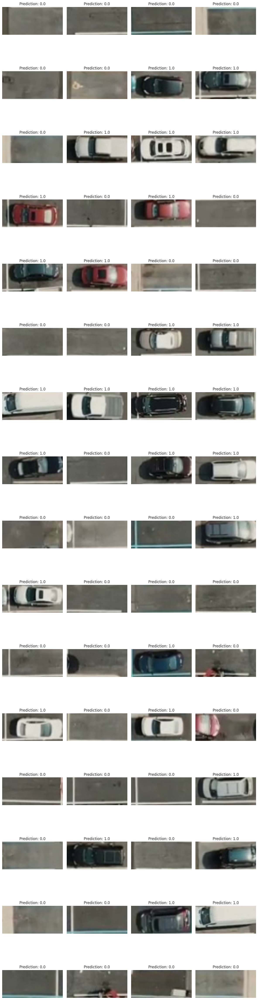

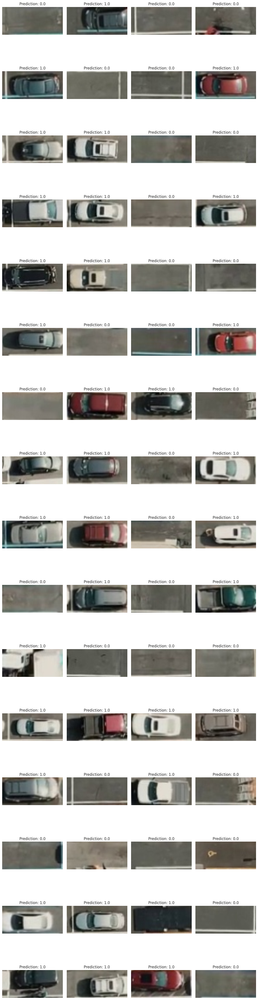

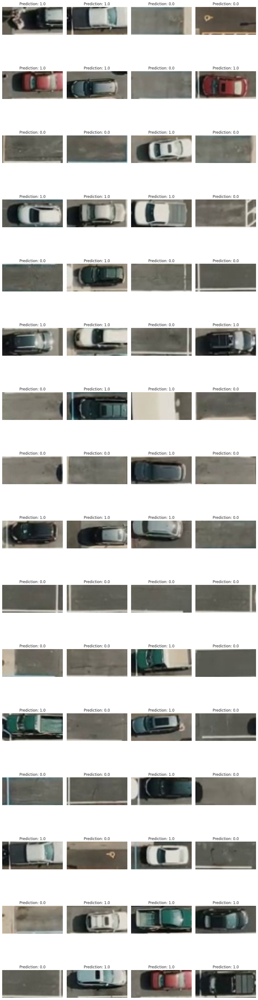

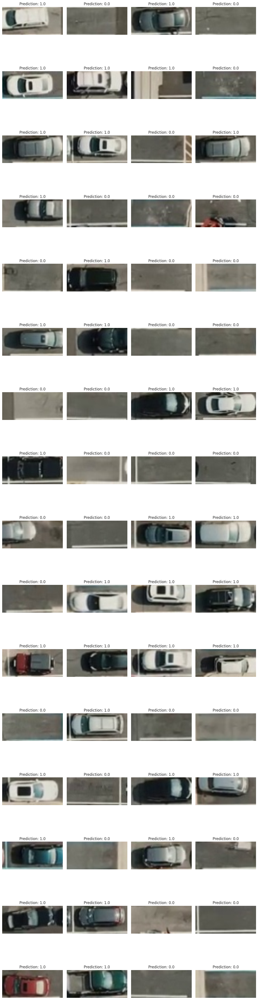

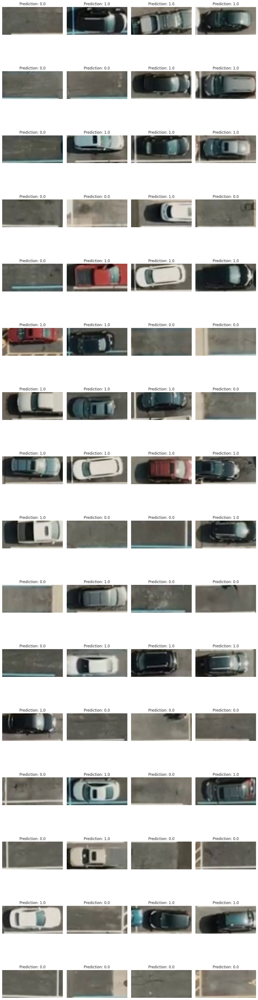

...

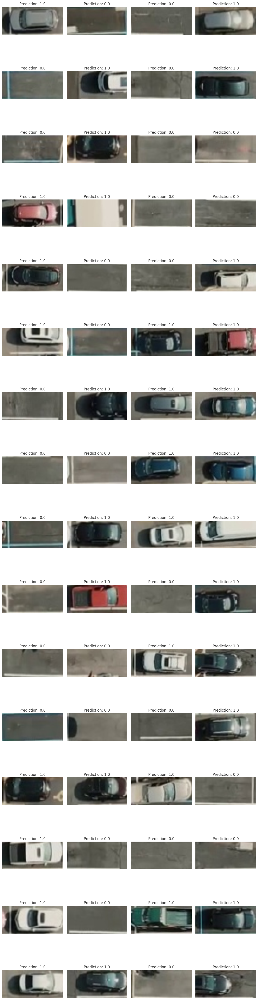

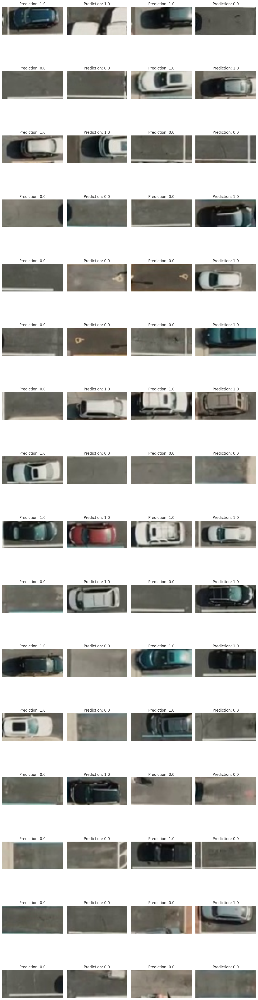

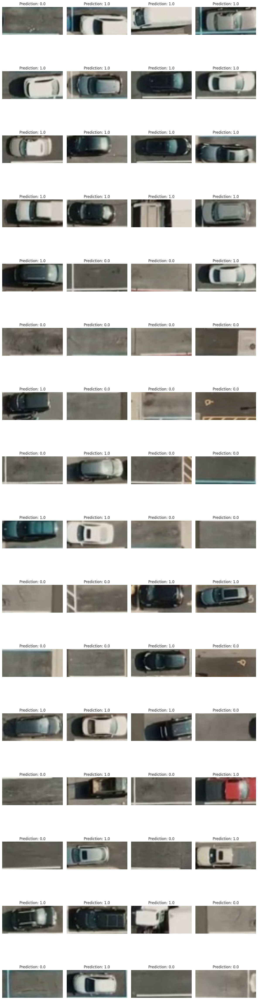

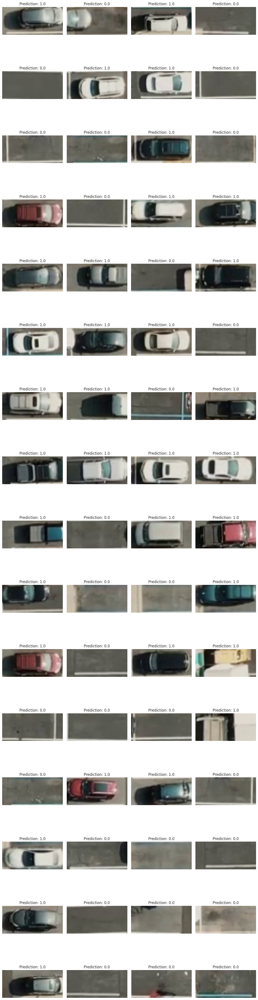

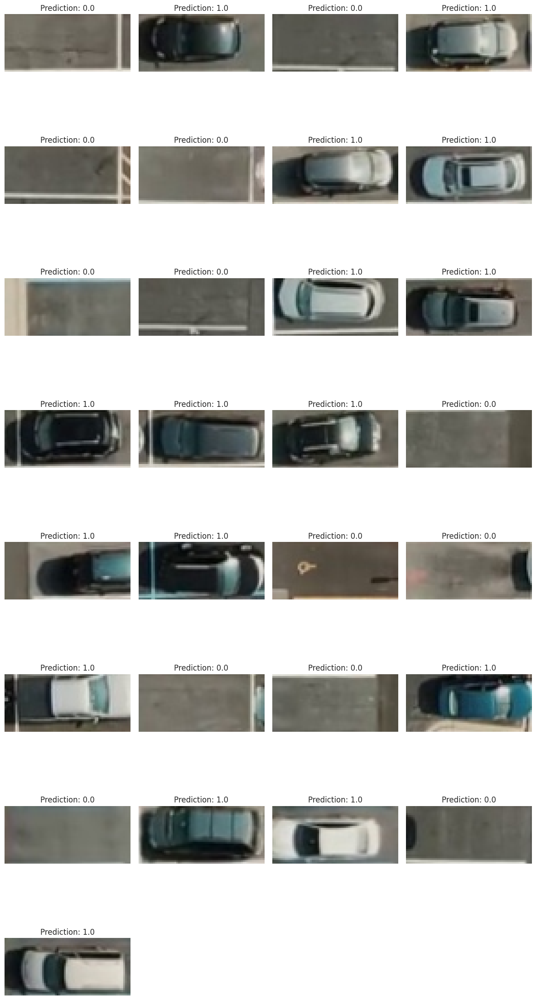

In [31]:
# Set model to evaluation mode
model.eval()

# Define the maximum number of images to display per row
max_images_per_row = 4

# Iterate over each batch in the test loader
for batch_idx, (images, _) in enumerate(test_loader):
    # Calculate the number of rows needed for the subplot
    num_rows = (len(images) - 1) // max_images_per_row + 1

    # Create a new figure for each batch
    fig = plt.figure(figsize=(12, 3 * num_rows))  # Adjust height based on the number of rows

    # Move images to the appropriate device
    images = images.to(device)

    with torch.no_grad():
        # Forward pass
        output = model(images)

    # Apply sigmoid to the output
    sigmoid_output = torch.sigmoid(output)
    binary_predictions = torch.round(sigmoid_output)

    # Convert predictions to CPU and numpy array
    binary_predictions = binary_predictions.cpu().numpy()

    # Track the total number of images plotted
    num_images_plotted = 0

    # Iterate over each image in the batch
    for i in range(len(images)):
        # Convert image to numpy array and transpose
        image_np = images[i].cpu().numpy().squeeze().transpose((1, 2, 0))

        # Plot the image in a subplot
        ax = fig.add_subplot(num_rows, max_images_per_row, num_images_plotted + 1)
        ax.imshow(image_np)
        ax.set_title(f"Prediction: {binary_predictions[i][0]}")
        ax.axis('off')

        # Increment the number of images plotted
        num_images_plotted += 1

        # Break the loop if the maximum number of images has been plotted
        if num_images_plotted >= len(test_loader.dataset):
            break

    # Adjust layout and display the figure for the current batch
    plt.tight_layout()
    plt.show()

    # Break the loop if the maximum number of images has been plotted
    if num_images_plotted >= len(test_loader.dataset):
        break

## Saving model

In [34]:
torch.save(model.state_dict(), 'final_resnet_optimized.pt')

In [35]:
files.download('/content/final_resnet_optimized.pt')


source_file_path = '/content/final_resnet_optimized.pt'

# Destination path in Google Drive
destination_folder = '/content/gdrive/My Drive/'
destination_file_path = destination_folder + 'final_resnet_optimized.pt'

# Copy the file to Google Drive
shutil.copyfile(source_file_path, destination_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'/content/gdrive/My Drive/final_resnet_optimized.pt'